In [383]:
%load_ext autoreload
%autoreload 2

import pandas as pd
import torch.optim as optim
from sklearn.utils.class_weight import compute_class_weight
from sklearn.preprocessing import StandardScaler

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [384]:
# Custom functions
from pt_helpers import *

In [385]:
# Use GPU if available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cpu')

# Pre-process the data

## Load the training data
This is the clean data that we processed in the notebook `Training_data_preparation`

In [386]:
data_path = "DATA/training_data/"
df = pd.read_csv(data_path+"VEX_edac_mag_labeled_15min_nan.csv")
df_brut = df.copy()
df['DATE_TIME'] = pd.to_datetime(df['DATE_TIME'])
df.set_index('DATE_TIME', drop=True, inplace=True)

## Split the dataset in training and testing set

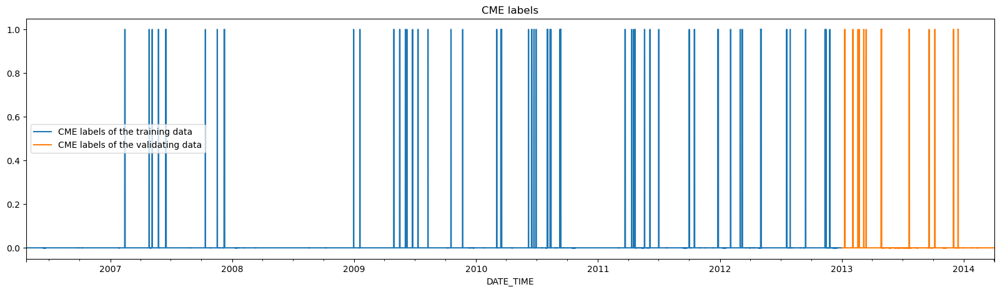

In [387]:
df_train = df.loc[:'2012-12-31'].copy()
df_test = df.loc['2013-01-01':'2014-04-01'].copy()

features = ['BX', 'BY', 'BZ', 'RSC']
label_feature = 'cme'

_, ax = plt.subplots(figsize=(20, 5))
df_train[label_feature].plot(ax=ax, label="CME labels of the training data")
df_test[label_feature].plot(ax=ax, label="CME labels of the validating data")
plt.title("CME labels")
plt.legend()
plt.show()

In [388]:
# Create the feature matrix and the labels
y_tr = df_train[label_feature].values
X_tr = df_train[features].values
y_te = df_test[label_feature].values
X_te = df_test[features].values

# Standardize the data
scaler = StandardScaler()
X_tr = scaler.fit_transform(X_tr)
X_te = scaler.transform(X_te)

print("Shape of y:", y_tr.shape)
print("Shape of X:", X_tr.shape)
print("Shape of y_test:", y_te.shape)
print("Shape of X_test:", X_te.shape)

Shape of y: (234624,)
Shape of X: (234624, 4)
Shape of y_test: (43776,)
Shape of X_test: (43776, 4)


## Create the feature sequence for the LSTM model

In [389]:
time_steps = 36 // 2   # 6 hours of data
n_features = len(features) # Number of features
X_train, y_train = create_sequences_without_nan(X_tr, y_tr, time_steps)
X_val, y_val = create_sequences_without_nan(X_te, y_te, time_steps)
y_train = (y_train > 0.5).astype(int)
y_val = (y_val > 0.5).astype(int)

print(X_train.shape, y_train.shape)
print(X_val.shape, y_val.shape)

(232610, 18, 4) (232610,)
(43258, 18, 4) (43258,)


## Augment the data of the CME events vy adding noise to tge features sequences

In [390]:
# if data augmentation is required
#X_train_aug, y_train_aug = augment_data(X_train, y_train, label_to_augment=1, factor=10, std=0.1)
#print(X_train_aug.shape, y_train_aug.shape, X_val.shape, y_val.shape)

# Train and evaluate the LSTM model

## Create the dataloaders and set the batch size

In [391]:
seed=48
torch.manual_seed(seed)
np.random.seed(seed)

def create_data_loader(X, y, batch_size, shuffle=False):
    dataset = TensorDataset(torch.tensor(X, dtype=torch.float32).to(device), torch.tensor(y, dtype=torch.float32).to(device))
    return DataLoader(dataset, batch_size=batch_size, shuffle=shuffle, num_workers=0)

# Create DataLoaders
batch_size = 128  # Adjust this based on your system's capability
train_loader = create_data_loader(X_train, y_train, batch_size, shuffle=True)
val_loader = create_data_loader(X_val, y_val, batch_size)

## Define the LSTM model

In [392]:
class CMEPredictor(nn.Module):
    def __init__(self, n_features, n_hidden=50, n_layers=1, dropout=0.0):
        super(CMEPredictor, self).__init__()
        self.lstm = nn.LSTM(input_size=n_features, hidden_size=n_hidden, num_layers=n_layers, batch_first=True, dropout=dropout)
        self.linear = nn.Linear(n_hidden, 1)

    def forward(self, x):
        x, _ = self.lstm(x)
        x = self.linear(x[:, -1, :])
        return torch.sigmoid(x)
    
def create_model(n_hidden, n_layers, dropout, pos_weight=None, lr=0.001):
    """
    Create a LSTM model for time series classification
    :param n_hidden: number of nodes in the hidden layer of the LSTM
    :param n_layers: number of layers in the LSTM
    :param dropout: dropout rate in the LSTM [0, 1]
    :param pos_weight: weight of the positibe class
    :param lr: learning rate
    :return: nn.Module (LSTM pytorch model)
    """
    model = CMEPredictor(n_features, n_hidden, n_layers, dropout=dropout).to(device)
    if pos_weight is None:
        class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(y_train), y=y_train)
        pos_weight = class_weights[1] / class_weights[0]
    
    pos_weight_tensor = torch.tensor(pos_weight, dtype=torch.float32).to(device)
    optimizer = optim.Adam(model.parameters(), lr=lr)
    criterion = nn.BCELoss(weight=pos_weight_tensor)
    return model, optimizer, criterion

In [393]:
def evaluate_model(model: nn.Module, data_loader: DataLoader):
    """
    Evaluate a trained model
    :param model: trained model
    :param data_loader: data to evaluate the model
    :return: accuracy, f1, precision, recall
    """
    model.eval()
    predictions = []
    true_labels = []
    with torch.no_grad():
        for X_batch, y_batch in data_loader:
            outputs = model(X_batch)
            predicted = (outputs > 0.5).float()  # Using 0.5 as the threshold for binary classification
            predictions.extend(predicted.view(-1).tolist())
            true_labels.extend(y_batch.tolist())

    # Calculate metrics
    accuracy = accuracy_score(true_labels, predictions)
    f1 = f1_score(true_labels, predictions)
    precision = precision_score(true_labels, predictions)
    recall = recall_score(true_labels, predictions)
    return accuracy, f1, precision, recall

def train_model(model, train_loader, eval_loader, criterion, optimizer, n_epochs):
    """
    Train the model 
    :param model: 
    :param train_loader: training dataset
    :param eval_loader: validation dataset
    :param criterion: Loss function
    :param optimizer: Optimizer for the training
    :param n_epochs: number of epochs (int)
    :return None
    """
    for epoch in range(n_epochs):
        model.train()
        for X_batch, y_batch in train_loader:
            optimizer.zero_grad()
            output = model(X_batch)
            loss = criterion(output, y_batch.view(-1, 1))
            loss.backward()
            optimizer.step()

        # Validation
        model.eval()
        with torch.no_grad():
            val_loss = 0
            for X_batch, y_batch in eval_loader:
                val_output = model(X_batch)
                val_loss += criterion(val_output, y_batch.view(-1, 1)).item()
        val_loss /= len(eval_loader)
        
        
def train_eval_model(model, train_loader, val_loader, criterion, optimizer, n_epochs):
    """
    Train and evaluate the model
    :return: validation and training scores
    """
    train_model(model, train_loader, val_loader, criterion, optimizer, n_epochs)
    val_scores = evaluate_model(model, val_loader)
    train_scores = evaluate_model(model, train_loader)
    return val_scores, train_scores


## Training parameters for the grid search

In [394]:
n_hidden = 5
n_layers = 2
dropout = 0.0
lr = 0.001
n_epochs = 10

model, optimizer, criterion = create_model(n_hidden, n_layers, dropout, lr=lr, pos_weight=None)
scores, train_scores = train_eval_model(model, train_loader, val_loader, criterion, optimizer, n_epochs)

### Training and evaluation

In [395]:
threshold = 0.5 # Using 0.5 as the threshold for binary classification, if larger than 0.5, then classified as a CME

def evaluate_model(model, data_loader):
    model.eval()
    predictions = []
    true_labels = []
    with torch.no_grad():
        for X_batch, y_batch in data_loader:
            outputs = model(X_batch)
            predicted = (outputs > threshold).float()  
            predictions.extend(predicted.view(-1).tolist())
            true_labels.extend(y_batch.tolist())

    # Calculate metrics
    accuracy = accuracy_score(true_labels, predictions)
    f1 = f1_score(true_labels, predictions)
    precision = precision_score(true_labels, predictions)
    recall = recall_score(true_labels, predictions)

    print(f'Accuracy: {accuracy}')
    print(f'F1 Score: {f1}')
    print(f'Precision: {precision}')
    print(f'Recall: {recall}')

In [ ]:
print("Train")
evaluate_model(model, train_loader)
print()
print("Eval")
evaluate_model(model, val_loader)

Train
Accuracy: 0.9845836378487597
F1 Score: 0.3950742240215925
Precision: 0.6804183614177803
Recall: 0.27834561445210365

Eval
Accuracy: 0.9735540246890748
F1 Score: 0.2164383561643836
Precision: 0.4463276836158192
Recall: 0.14285714285714285


In [ ]:
# Plot the predictions
eval_loader = val_loader
eval_model = model

eval_model.eval()

predictions = []
true_labels = []
with torch.no_grad():
    val_loss = 0
    for X_batch, y_batch in eval_loader:
        val_output = eval_model(X_batch)
        predictions.extend(val_output.view(-1).tolist())
        true_labels.extend(y_batch.tolist())
print(predictions)

[0.0016543626552447677, 0.0025269624311476946, 0.004315644968301058, 0.007366759702563286, 0.009327568113803864, 0.0055820029228925705, 0.003596774535253644, 0.0026937476359307766, 0.0022868304513394833, 0.0024043910671025515, 0.002440637443214655, 0.0023607800249010324, 0.002299745799973607, 0.0025892462581396103, 0.0031560100615024567, 0.0036916760727763176, 0.0035216440446674824, 0.003041310468688607, 0.0021908851340413094, 0.0014886190183460712, 0.0012075072154402733, 0.0010960772633552551, 0.0011119561968371272, 0.0012470500078052282, 0.0014567481121048331, 0.0017272752011194825, 0.0021191926207393408, 0.002791705774143338, 0.003327675862237811, 0.0036452750209718943, 0.0038017607294023037, 0.0038303816691040993, 0.004153722431510687, 0.0048053814098238945, 0.005215064622461796, 0.005390091799199581, 0.005550696048885584, 0.005587240215390921, 0.005402160808444023, 0.005164743401110172, 0.0050979433581233025, 0.005046170670539141, 0.004731866996735334, 0.00464040320366621, 0.00461

In [ ]:
X_after = X_val[:, 0, :]
df_pred = pd.DataFrame({'pred': predictions, 'true': true_labels, 'BX': X_after[:, 0], 'BY': X_after[:, 1], 'BZ': X_after[:, 2]})
df_pred['pred_label'] = (df_pred['pred'] > 0.5).astype(int)

C:\Users\nasta\AppData\Local\Temp\ipykernel_21732\385703723.py:4: RuntimeWarning: invalid value encountered in divide
  f1 = 2 * precision * recall / (precision + recall)


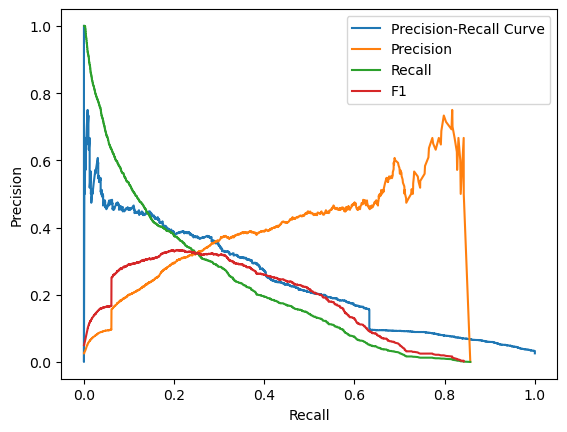

[0. 0. 0. ... 0. 0. 0.]
Accuracy: 0.9735540246890748
F1 Score: 0.2164383561643836
Precision: 0.4463276836158192
Recall: 0.14285714285714285


In [ ]:
# Plot recall precision curve
from sklearn.metrics import precision_recall_curve
precision, recall, thresholds = precision_recall_curve(df_pred['true'], df_pred['pred'])
f1 = 2 * precision * recall / (precision + recall)
plt.plot(recall, precision, label="Precision-Recall Curve")
plt.plot(thresholds, precision[:-1], label="Precision")
plt.plot(thresholds, recall[:-1], label="Recall")
plt.plot(thresholds, f1[:-1], label='F1')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.show()

true_labels = df_pred['true'].values
pred = df_pred['pred_label'].values

print(true_labels)
accuracy = accuracy_score(true_labels, pred)
f1 = f1_score(true_labels, pred)
precision = precision_score(true_labels, pred)
recall = recall_score(true_labels, pred)

print(f'Accuracy: {accuracy}')
print(f'F1 Score: {f1}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')

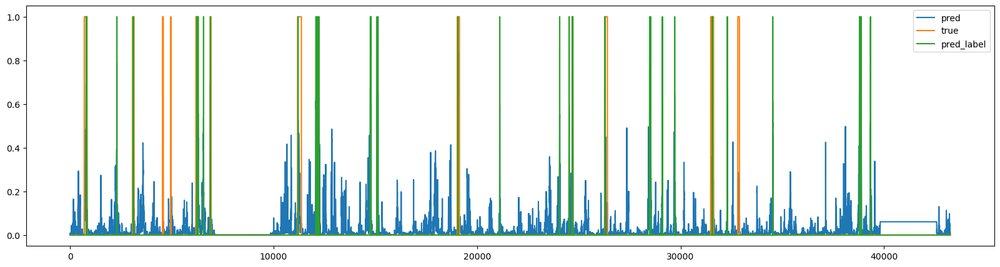

In [ ]:
df_pred[['pred', 'true', 'pred_label']].plot(figsize=(20, 5))
plt.show()

In [ ]:
df_train_brut = df_brut.loc[df_brut["DATE_TIME"] < '2013-01-01'].copy()
df_test_brut = df_brut.loc[df_brut["DATE_TIME"] >= '2013-01-01'].copy()
df_test_brut = df_test_brut.loc[df_test_brut["DATE_TIME"] < '2014-04-02']
df_test_brut = df_test_brut.reset_index(drop=True)

# Show some CME
mag_names = ['BX', 'BY', 'BZ']
pred_names = ['pred', 'true', 'pred_label']

df_pred_plot = df_pred.copy()
df_pred_plot[pred_names] *= 5

#display(df_pred_plot.head())
display(df_test_brut.shape)
display(df_test.shape)

df_test_brut = df_test_brut['DATE_TIME']
df_pred_plot = df_pred_plot.merge(df_test_brut, left_index=True, right_index=True)
df_pred_plot['DATE_TIME'] = pd.to_datetime(df_pred_plot['DATE_TIME'])
df_pred_plot.set_index('DATE_TIME', inplace=True, drop=True)
display(df_pred_plot.head())


(43776, 11)

(43776, 10)

,pred,true,BX,BY,BZ,pred_label
DATE_TIME,,,,,,
2013-01-01 00:00:00,0.008272,0.0,0.081355,0.877723,0.049835,0
2013-01-01 00:15:00,0.012635,0.0,0.249200,0.759572,0.453008,0
2013-01-01 00:30:00,0.021578,0.0,0.043966,0.805698,0.707006,0
2013-01-01 00:45:00,0.036834,0.0,-0.401459,0.442388,1.263749,0
2013-01-01 01:00:00,0.046638,0.0,-0.461757,0.351024,1.276364,0


<Axes: xlabel='DATE_TIME'>

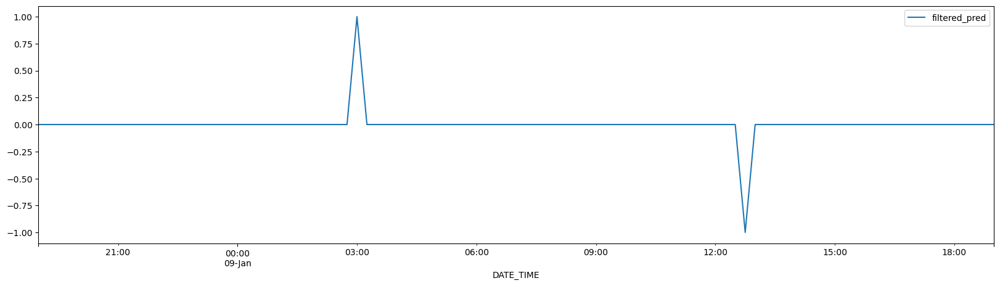

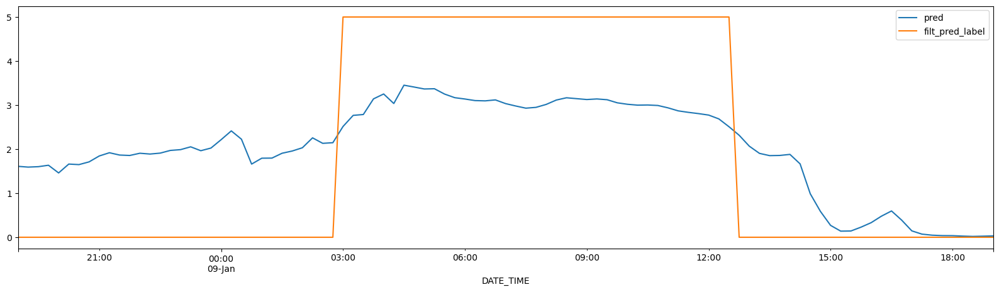

In [ ]:
df_pred_plot['filtered_pred'] = df_pred_plot['pred_label'].diff() / 5 # 1 for begining of CME & -1 for end of CME
df_pred_plot[['filtered_pred']].loc['2013-01-08 19:00:00':'2013-01-09 19:00:00'].plot(figsize=(20, 5))

start_pred_df = df_pred_plot[df_pred_plot['filtered_pred'] == 1].copy() # put all the start of CME date in a dataframe
start_pred_df.reset_index(drop=False, inplace=True)
start_pred_df.rename(columns={'DATE_TIME': 'start_date'}, inplace=True)
start_pred_df = start_pred_df[['start_date']]
end_pred_df = df_pred_plot[df_pred_plot['filtered_pred'] == -1].copy() # put all the end of CME date in a dataframe
end_pred_df.reset_index(drop=False, inplace=True)
end_pred_df.rename(columns={'DATE_TIME': 'end_date'}, inplace=True)
end_pred_df = end_pred_df[['end_date']]

length_pred_df = start_pred_df.merge(end_pred_df, left_index=True, right_index=True)

length_pred_df['start_date'] = pd.to_datetime(length_pred_df['start_date'])
length_pred_df['end_date'] = pd.to_datetime(length_pred_df['end_date'])
time_difference = length_pred_df['end_date'] - length_pred_df['start_date']
length_pred_filt_df = length_pred_df[time_difference >= pd.Timedelta(hours=2)] # Keep only the CME prediction with a duration of at least 2 hours

df_pred_plot['filt_pred_label'] = 0

for index, row in length_pred_filt_df.iterrows():
    mask_start = df_pred_plot.index == row['start_date'] # keep only the filtered CME prediction
    mask_end = df_pred_plot.index == row['end_date']
    df_pred_plot.loc[mask_start, 'filt_pred_label'] = 5
    df_pred_plot.loc[mask_end, 'filt_pred_label'] = -5

df_pred_plot['filt_pred_label'] = df_pred_plot['filt_pred_label'].cumsum()

#display(df_pred_plot.head())
df_pred_plot[['pred', 'filt_pred_label']].loc['2013-01-08 19:00:00':'2013-01-09 19:00:00'].plot(figsize=(20, 5))

<Axes: xlabel='DATE_TIME'>

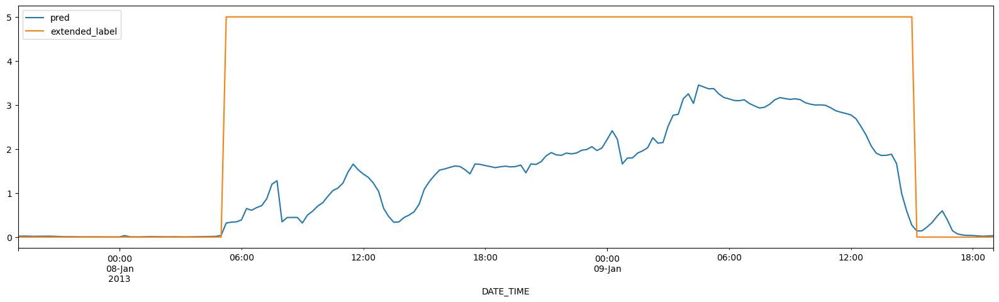

In [ ]:
df_pred_plot['extended_label'] = 0

# expending forward
expanding_window = False
current_window_start = 0

for index, row in df_pred_plot.iterrows():
    if row['filt_pred_label'] == 5:
        expanding_window = True
        current_window_start = index

    if expanding_window and row['pred'] > 0.2:
        df_pred_plot.loc[current_window_start:index, 'extended_label'] = 5
    else:
        expanding_window = False


# expending backward
expanding_window = False
current_window_start = 0

for index, row in df_pred_plot.iloc[::-1].iterrows():
    if row['filt_pred_label'] == 5:
        expanding_window = True
        current_window_start = index

    if expanding_window and row['pred'] > 0.2:
        df_pred_plot.loc[index:current_window_start, 'extended_label'] = 5
    else:
        expanding_window = False

        
df_pred_plot[['pred', 'extended_label']].loc['2013-01-07 19:00:00':'2013-01-09 19:00:00'].plot(figsize=(20, 5))

In [ ]:
pred = df_pred_plot['extended_label'].values / 5

accuracy = accuracy_score(true_labels, pred)
f1 = f1_score(true_labels, pred)
precision = precision_score(true_labels, pred)
recall = recall_score(true_labels, pred)

print(f'Accuracy: {accuracy}')
print(f'F1 Score: {f1}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')

Accuracy: 0.966179666188913
F1 Score: 0.3359055832955062
Precision: 0.33728350045578853
Recall: 0.3345388788426763


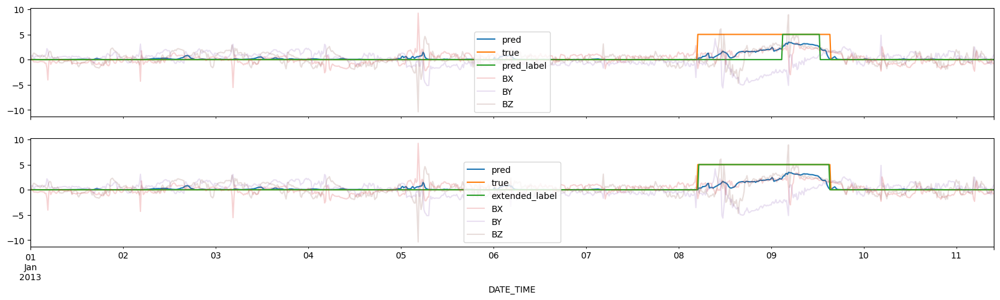

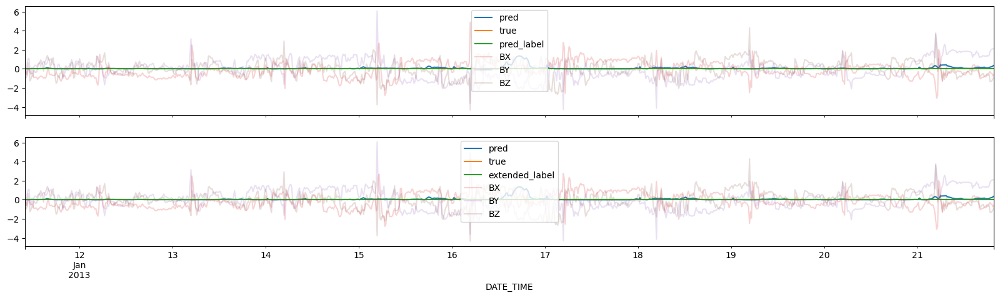

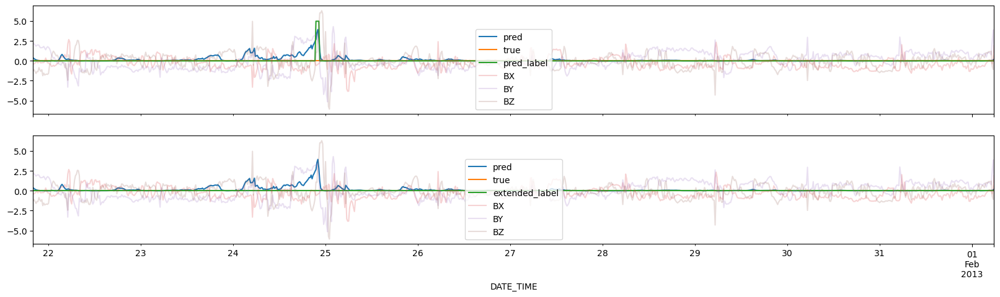

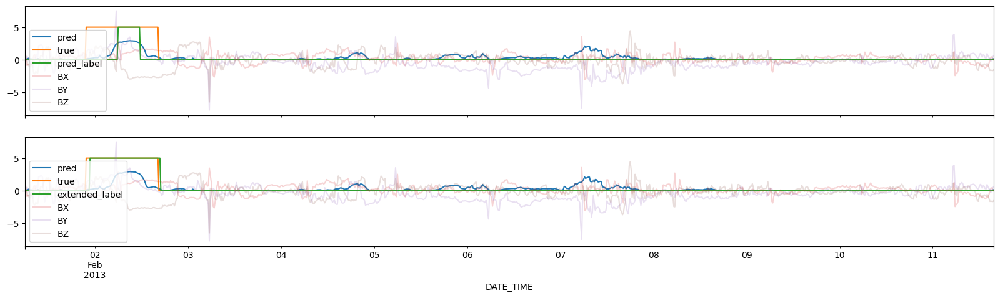

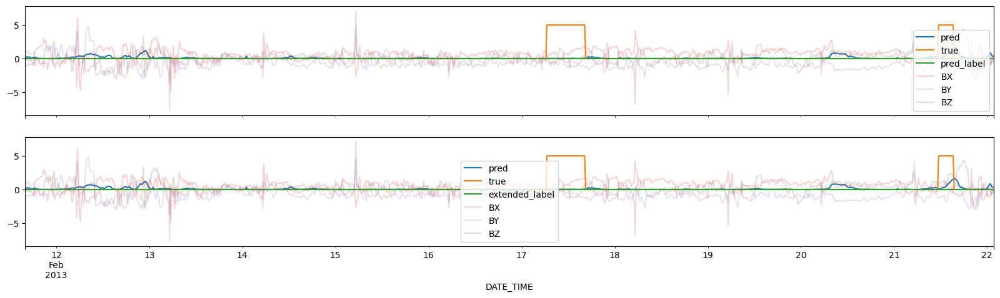

...

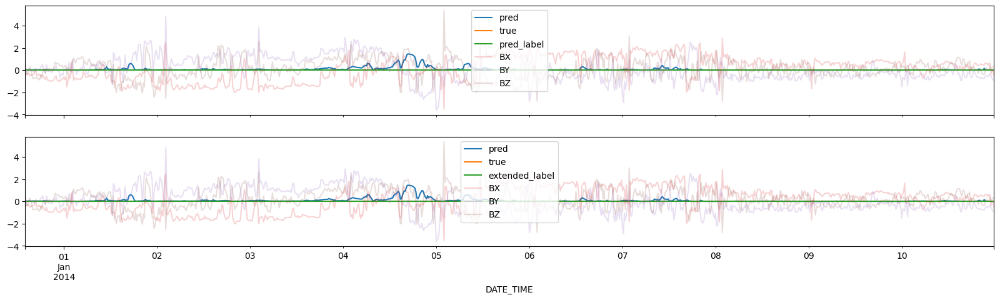

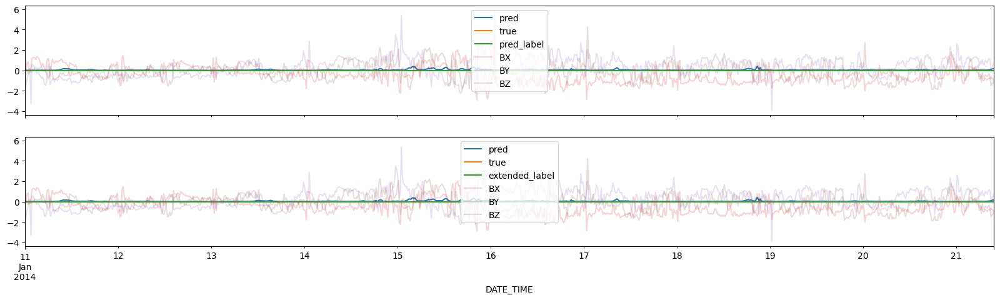

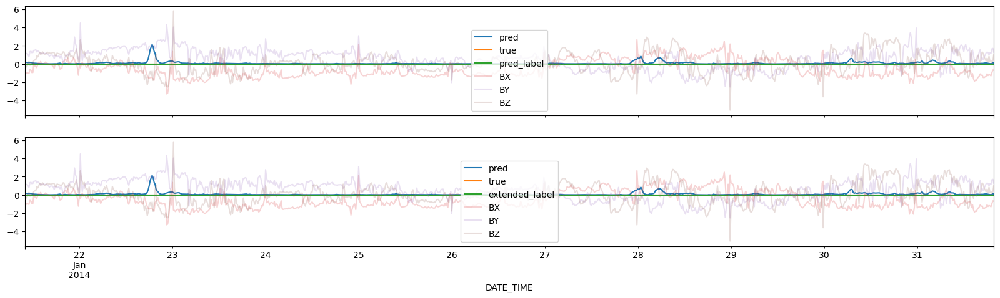

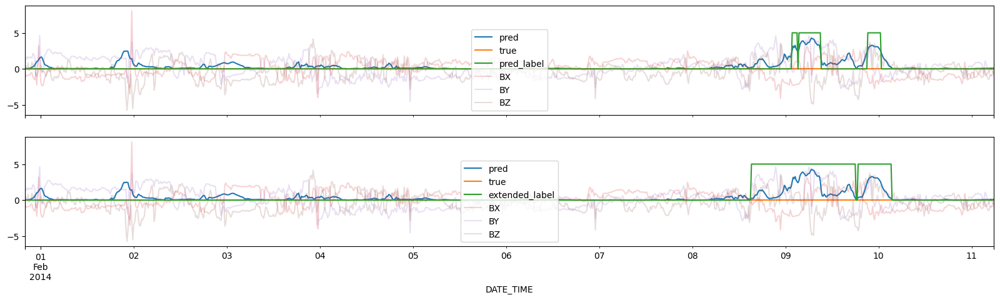

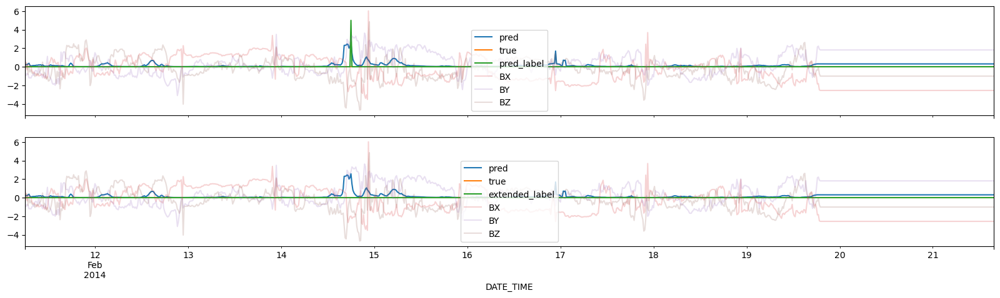

In [ ]:
for i in range(0, 40):
    fig, (pA, pB) = plt.subplots(2, figsize=(20, 5), sharex=True)
    df_pred_plot[['pred', 'true', 'pred_label']].iloc[i*1000:(i+1)*1000].plot(ax=pA)
    df_pred_plot[['BX', 'BY', 'BZ']].iloc[i*1000:(i+1)*1000].plot(ax=pA, alpha=0.2)
    df_pred_plot[['pred', 'true', 'extended_label']].iloc[i*1000:(i+1)*1000].plot(ax=pB)
    df_pred_plot[['BX', 'BY', 'BZ']].iloc[i*1000:(i+1)*1000].plot(ax=pB, alpha=0.2)
    plt.show()